<a href="https://colab.research.google.com/github/leodenale/python-acoustics/blob/master/examples/signal_class.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# The `Signal` class


==== Google Colab Setup ==============================

Mounting Google Drive in Google Colab

In [0]:
from google.colab import drive
drive.mount('/mydrive')

*Navigating to project directory*

In [0]:
cd ..

In [0]:
ls

In [0]:
cd mydrive/My Drive/Colab Notebooks

In [0]:
!git clone https://github.com/leodenale/python-acoustics.git

In [0]:
cd python-acoustics

In [12]:
ls

acoustics/   develop.nix  LICENSE      pylintrc     requirements.txt  tests/
data/        docs/        Makefile     README.md    setup.cfg
default.nix  examples/    MANIFEST.in  release.nix  setup.py


==== Google Colab Setup (END) ========================

The `Signal` class is a container based on the `np.array` storing besides the samples as function of time also a sample frequency. The class has many usefull methods making the life of an acoustician a bit easier. 
Furthermore, because its based on the `np.array`, all operations you would normally perform on a `np.array` can be done on a `Signal` as well. 

In [0]:
# Install acoustics package
!pip install acoustics

In [0]:
from acoustics import Signal
import numpy as np
%matplotlib inline
from IPython.display import Audio
import seaborn as sns # seaborn for prettier graphs

## Creating an instance
A `Signal` takes two arguments, the first an array of samples, and the second a sample frequency.

In [0]:
s = Signal(np.random.randn(44100), fs=11025)

Alternatively, one of the alternative constructors can be used

In [0]:
#s = Signal.from_wav('data/living_room_1.wav')
s = Signal.from_wav('data/ir_sportscentre_omni.wav')

## Attributes

An instance of `Signal` stores besides the instantaneous values also the sample frequency

In [32]:
s.fs

96000

The `Signal` class can handle multiple signals. Currently we have only one channel.

In [33]:
s.channels

1

The amount of samples in the signal can be retrieved in several ways. We can use the standard ways, `len(s)`, or `s.shape` but also the method `s.samples`

In [34]:
s.samples

940800

##Play signal with IPython
The recording is of an aircraft flyover as you can hear.

In [35]:
Audio(data=s, rate=s.fs)

## Spectral analysis

Let's continue for now with analysing the recording.

We can start with looking at the spectrum. A narrowband power spectrum can be calculated using `s.power_spectrum()`

In [36]:
s.power_spectrum()

(array([0.00000000e+00, 1.02040816e-01, 2.04081633e-01, ...,
        4.79996939e+04, 4.79997959e+04, 4.79998980e+04]),
 array([5.03307089e-16, 2.00930895e-15, 1.42912167e-15, ...,
        6.49423997e-14, 1.29107013e-13, 1.63961117e-13]))

returning frequencies and powers. It's also possible to straightaway plot the power spectrum

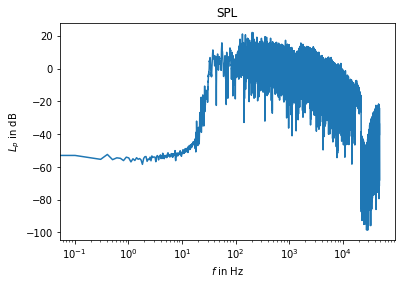

In [37]:
fig = s.plot_power_spectrum()

There are other types of spectra available, like for example the phase spectrum. Another popular figure is the spectrogram

In [0]:
fig = s.spectrogram()

## Sound pressure level

The methods shown so far are quite common operations, not specific to acoustics alone. But, the `Signal` class has some more acoustics-specific methods as well. For example, we can calculate the sound pressure level as function of time using `s.levels()` or instead plot the values 

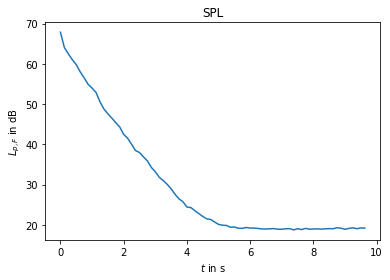

In [39]:
fig = s.plot_levels()

## Fractional octaves

The label is the channel number, using zero-based numbering as is common in Python. We can also calculate and plot 1/1-octaves with respectively `s.octaves()` and `s.plot_octaves()`.

11 11


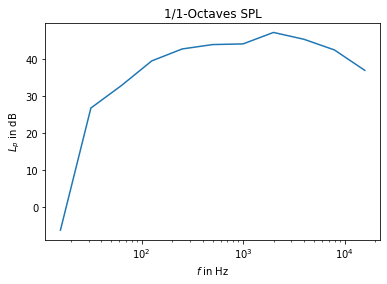

In [40]:
fig = s.plot_octaves()

Calculating or plotting 1/3-octaves is also possible.

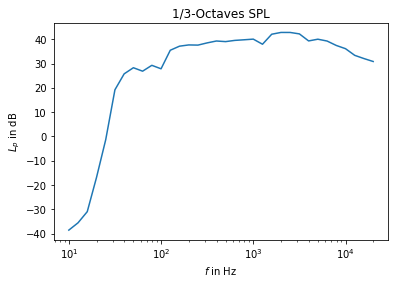

In [41]:
fig = s.plot_third_octaves()

## Frequency weighting

The `acoustics` package features frequency weighting in several ways. When having a signal like shown in this example, frequency weighting can be applied directly using the `weigh` method.


In [42]:
s.weigh('A')

Signal([ 0.00000000e+00 -2.18804576e-05 -5.40201951e-05 ... -9.65570375e-06
  3.90367756e-06 -1.41338990e-07])

This can be seen better when plotting in octaves.

11 11


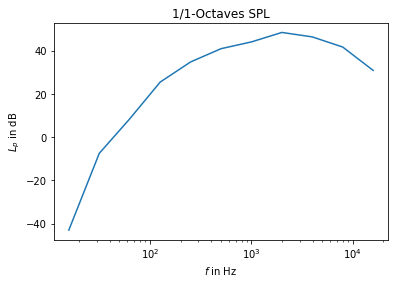

In [43]:
fig = s.weigh('A').plot_octaves()

## Descriptors

The signal class also features several descriptors, like e.g. $L_{eq}$.
Let's calculate as an example the A-weighted equivalent level over the event, i.e. $L_{A,eq}$.

In [44]:
s.weigh('A').leq()

52.21638912525676

This value is a bit below the unweighted $L_{Z,eq}$.

In [45]:
s.leq()

52.76911319923724

We can verify the calculation by using a different method. Let's calculate 1/3-octave values first, and then add the weighting. The A-weighting is

In [46]:
from acoustics.standards.iec_61672_1_2013 import WEIGHTING_VALUES
WEIGHTING_VALUES['A']

array([-70.4, -63.4, -56.7, -50.5, -44.7, -39.4, -34.6, -30.2, -26.2,
       -22.5, -19.1, -16.1, -13.4, -10.9,  -8.6,  -6.6,  -4.8,  -3.2,
        -1.9,  -0.8,   0. ,   0.6,   1. ,   1.2,   1.3,   1.2,   1. ,
         0.5,  -0.1,  -1.1,  -2.5,  -4.3,  -6.6,  -9.3])

and the A-weighted $L_{A,eq}$ determined using this method is

In [47]:
from acoustics.decibel import dbsum
dbsum( s.third_octaves()[1] + WEIGHTING_VALUES['A'] )

ValueError: ignored

## Multichannel signal

The Signal container can store more then one channel


In [0]:
s2 = Signal([s,s,s], s.fs)

as we can see

In [49]:
s2.channels

3

Most methods still work when considering multichannel signals.

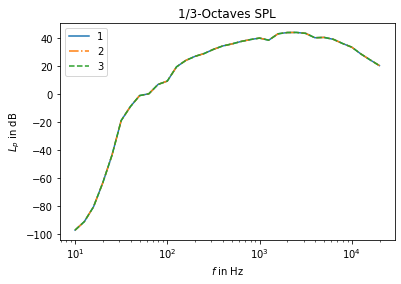

In [50]:
fig = s2.weigh('A').plot_third_octaves()

## Exporting to wav

Finally, a signal can be written to WAV format easily as well using `s.to_wav(filename)`. You might want to normalize your signal first though, so e.g. `s.normalize().to_wav(filename)`.

In [0]:
s2.normalize().to_wav('data/output.wav')

In [0]:
s2 = Signal.from_wav('data/output.wav')

In [53]:
Audio(data=s2, rate=s2.fs)